<!-- <img src="https://github.com/FarhanMS123/NeuralNetworkMemorandum/blob/main/vision/2150765663.jpg?raw=true" height="400" /> -->
<img src="./ColorBlendAlgorithm/2150765663.jpg" height="400" />
<br />
<a href="https://www.freepik.com/free-photo/people-enjoying-guarana-drink-outdoors_66104275.htm#fromView=serie&position=39&from_element=series_block">Image by freepik</a>

In [13]:
import requests
import colorsys

import numpy as np
from PIL import Image, ImageDraw, ImageColor
import cairo

In [14]:
img_src = "https://github.com/FarhanMS123/NeuralNetworkMemorandum/blob/main/vision/ColorBlendAlgorithm/2150765663.jpg?raw=true"
# img_src = "./2150765663.jpg"
img_dst = "square.jpg"
img_s = 660
img_LTRB = (90, 0, img_s + 90, img_s)

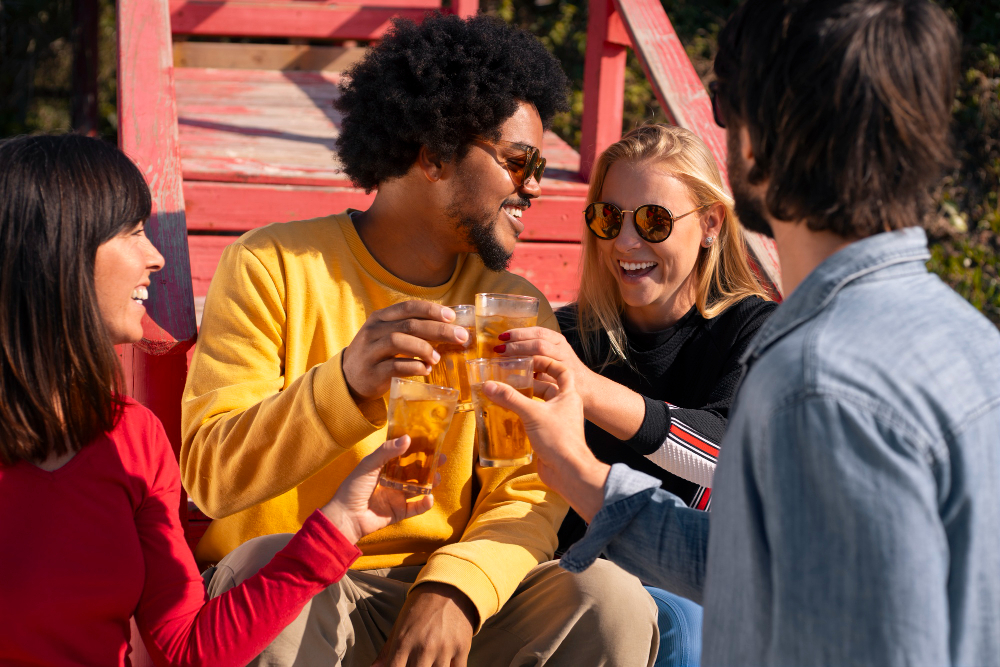

In [15]:
# https://www.geeksforgeeks.org/how-to-open-an-image-from-the-url-in-pil/
# https://stackoverflow.com/questions/7391945/how-do-i-read-image-data-from-a-url-in-python
# https://pillow.readthedocs.io/en/stable/reference/Image.html#PIL.Image.Image.crop
# https://stackoverflow.com/questions/26649716/how-to-show-pil-image-in-ipython-notebook

with requests.get(img_src, stream=True) as req:
  with Image.open(req.raw) as im:
    im_crop = im #.crop(img_LTRB)
    im_crop = im_crop.convert("RGB")
    display(im_crop)

In [16]:
def tf_rgb(f):
  im_corp_np = np.array(im_crop)
  hsl_array = np.copy(im_corp_np) / 255.0

  hsl_array_cp = np.copy(hsl_array)
  for i in range(im_corp_np.shape[0]):
      for j in range(im_corp_np.shape[1]):
          r, g, b = hsl_array[i, j]
          h, l, s = colorsys.rgb_to_hls(r, g, b)
          hsl_array_cp[i, j] = f(r, g, b, h, l, s)
  
  return Image.fromarray(np.clip(hsl_array_cp * 255, 0, 255).astype(np.uint8))

## HSL: Test High Saturation-Brightness of Color Transformation

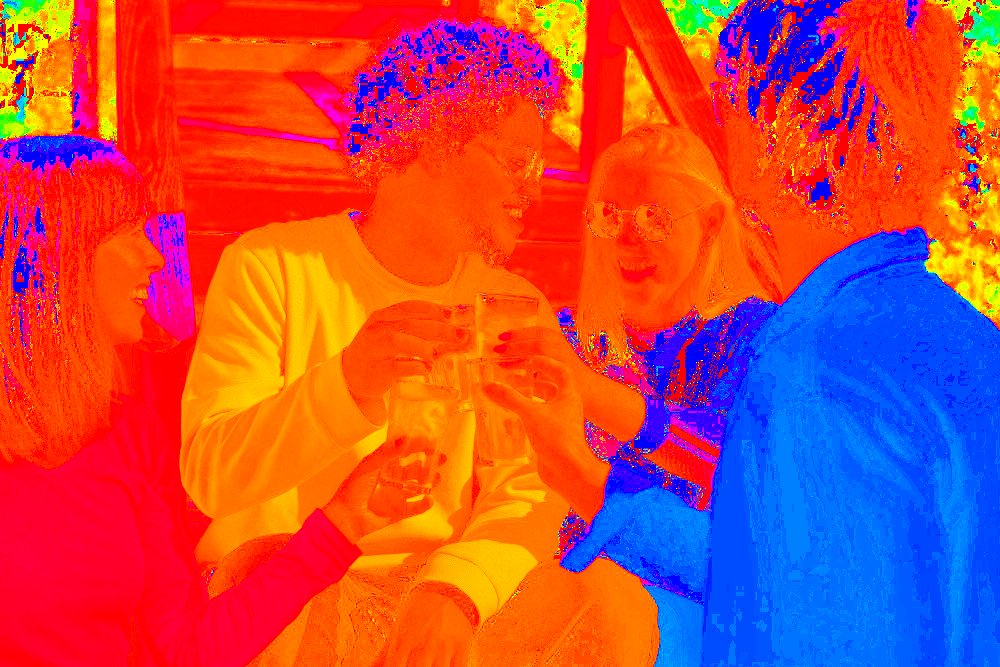

In [17]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(h, 0.5, 1.0) # Hue
))

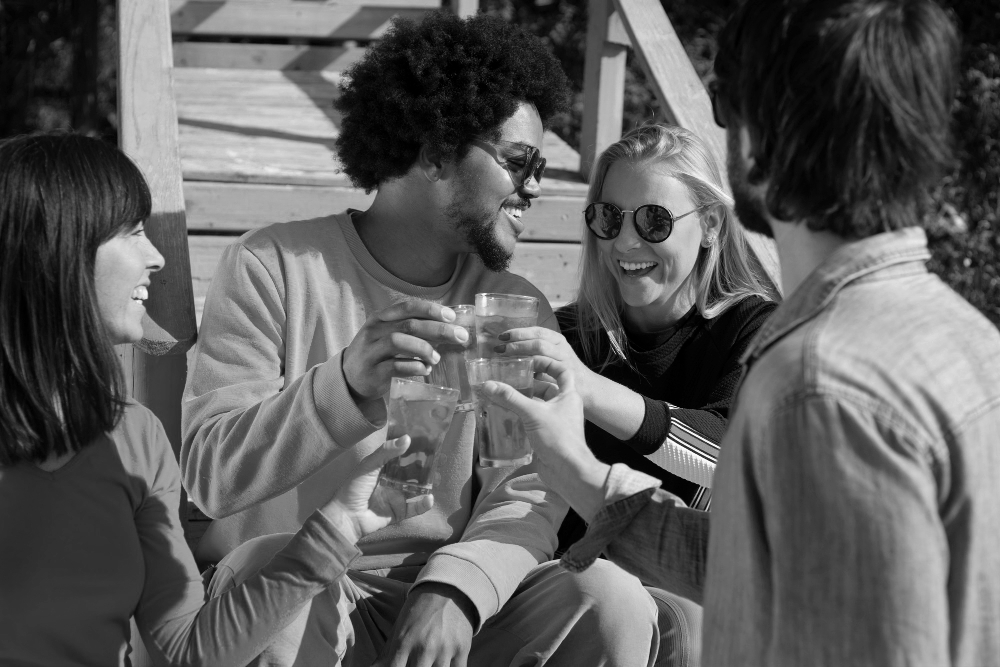

In [18]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(180 / 255, l, 0.0) # Grayscale
))

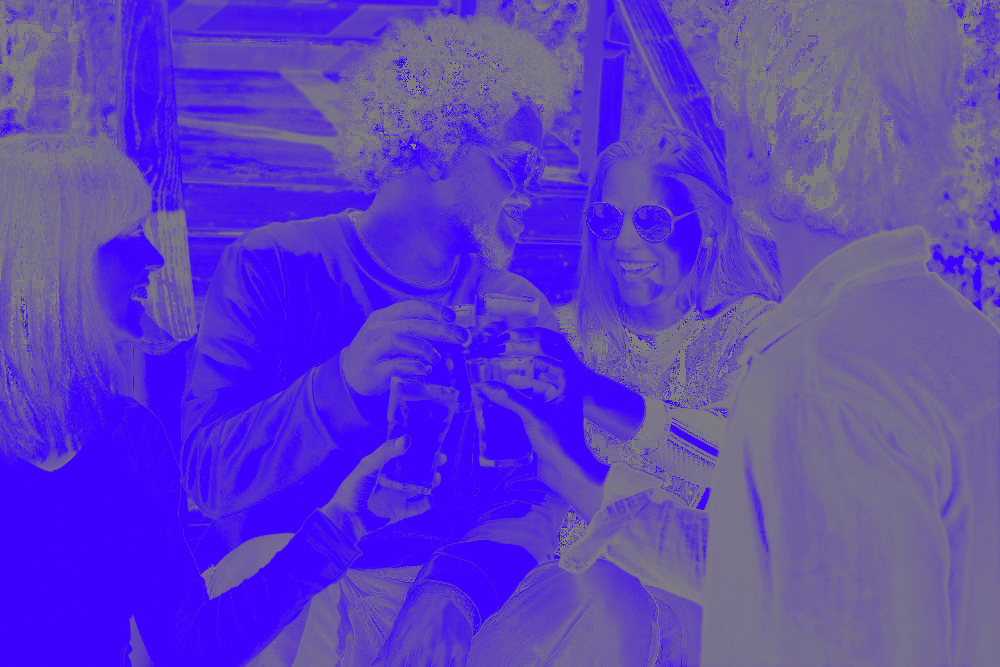

In [19]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(180 / 255, 0.5, s)
))

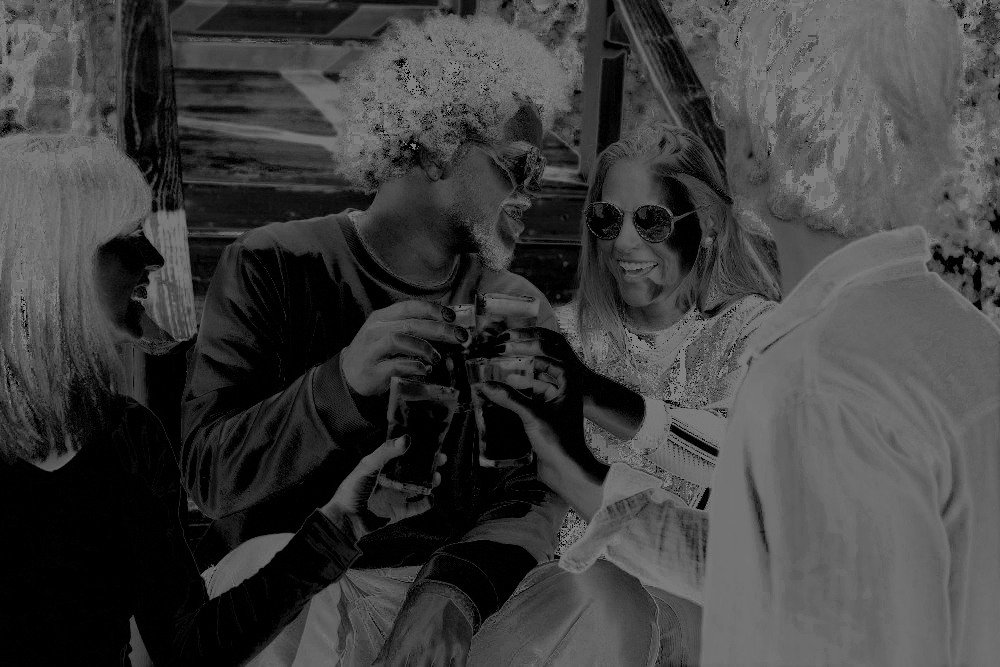

In [20]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(180 / 255, (1 - s) * 0.5, 0.)
))

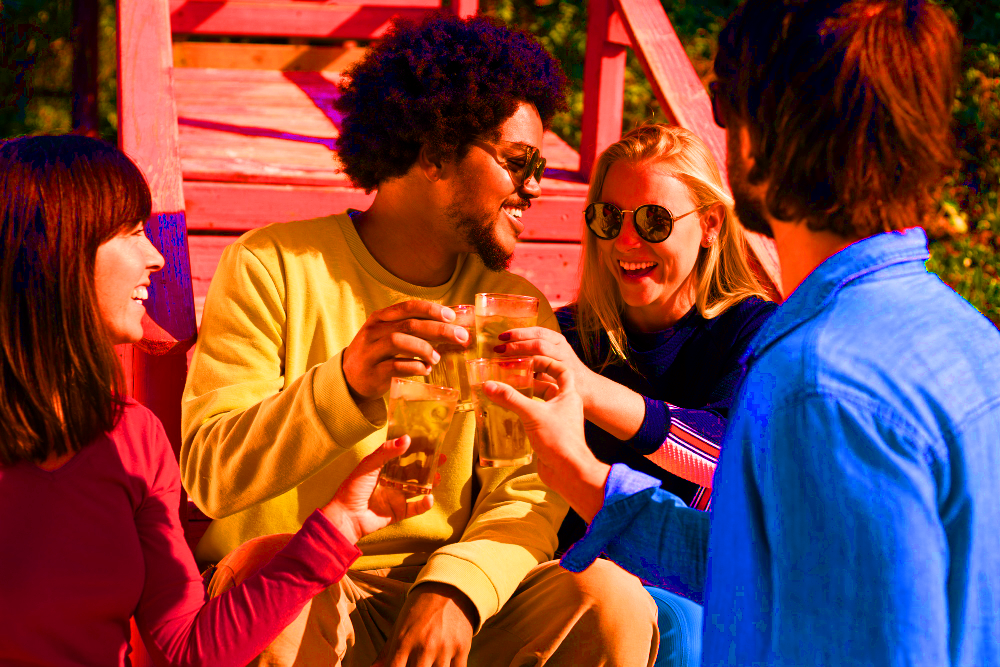

In [21]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(h, l, 1.0)
))

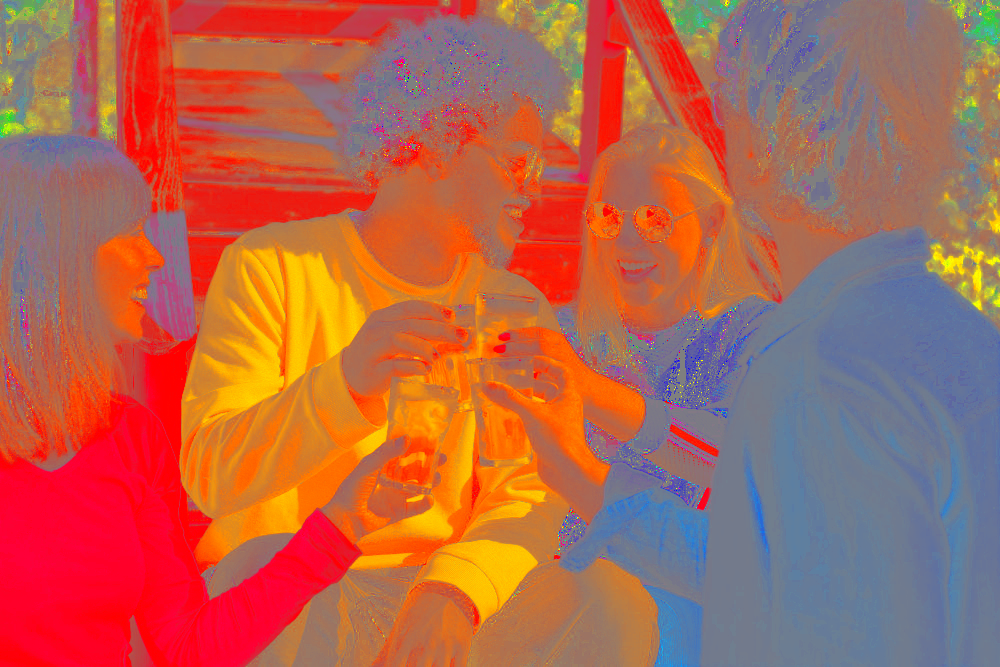

In [22]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(h, .5, s)
))

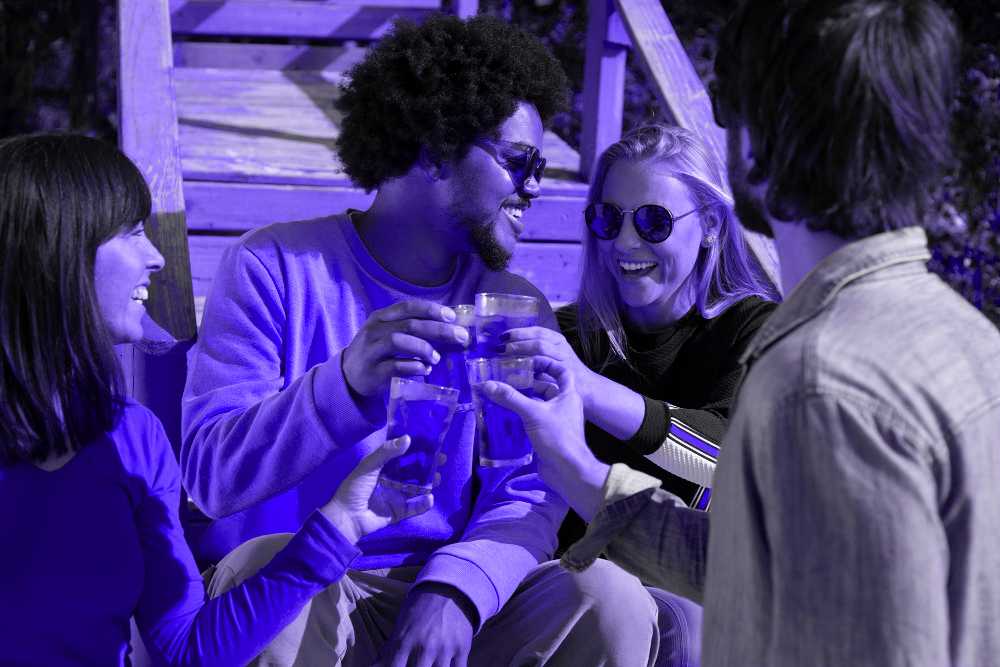

In [23]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(180 / 255, l, s)
    # colorsys.hls_to_rgb(180 / 255, 0.5, s)
    # colorsys.hls_to_rgb(h, l, s)
))

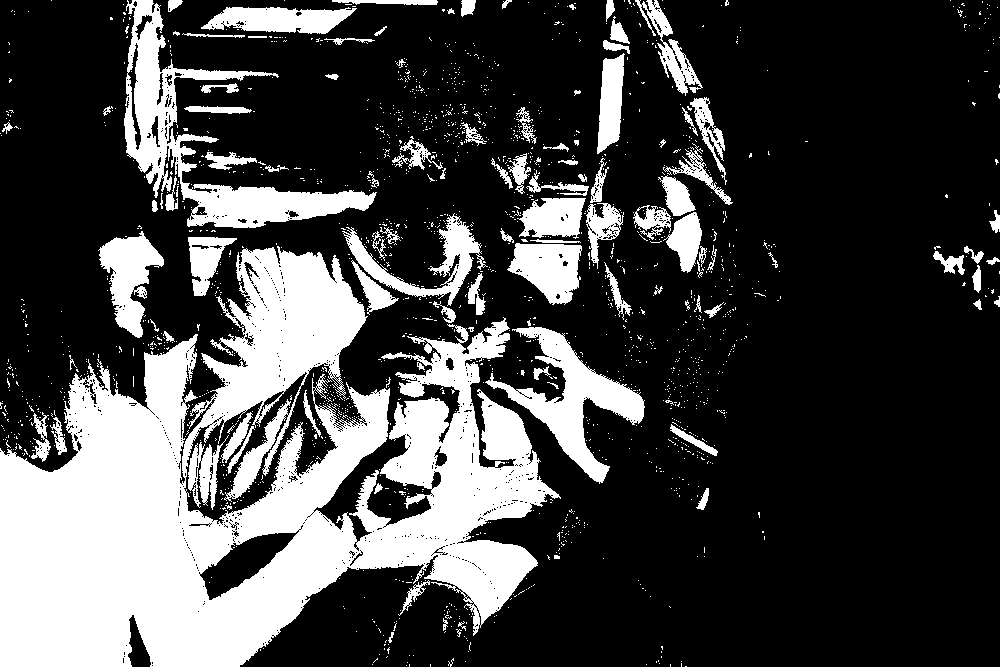

In [24]:
def temp1_func (r, g, b, h, l, s):
  l2 = 0.5 + (s * 0.5)
  # l = 1.0 if l >= 0.89 else 0
  l2 = 1.0 if l2 >= 0.89 else 0
  return colorsys.hls_to_rgb(180 / 255, l2, s) # Gray-Light
        

display(tf_rgb(
  temp1_func
))

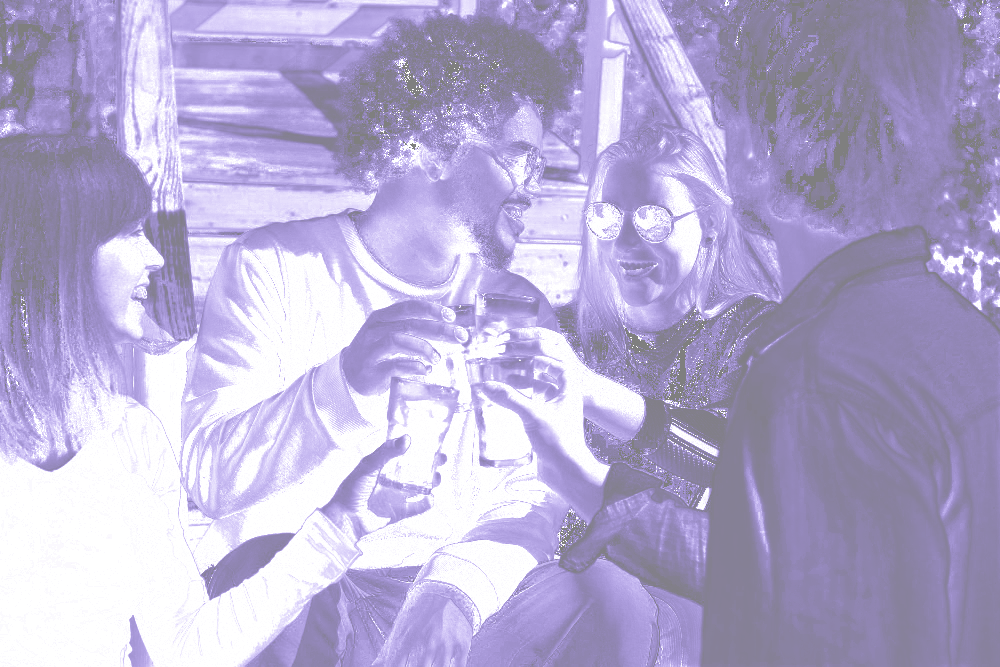

In [25]:
display(tf_rgb(
  lambda r, g, b, h, l, s :
    colorsys.hls_to_rgb(180 / 255, 0.5 + (s * 0.5), s) # Gray-Light
))